In [1]:
import sys
import xarray as xr
import glob
import dask
import cartopy.crs as ccrs
import cmocean
import matplotlib.pyplot as plt
import re
import datetime
from functions.grid_to_km import area
import cartopy
import cartopy.crs as ccrs
import matplotlib as mpl
import numpy as np
from scipy.sparse import csr_matrix
import matplotlib.animation as animation
from matplotlib import rc
%matplotlib inline

In [2]:
import matplotlib as mpl
from matplotlib import rcParams

################################################################
plt.style.use(['default'])

# plotting parameters
mpl.rcParams['font.size'] = 14
mpl.rcParams['font.weight'] = 'normal'

mpl.rcParams["figure.figsize"] = [8 , 4]
mpl.rcParams['legend.fontsize'] = 12      #legend size
#title params
mpl.rcParams['axes.titlesize'] = 20
mpl.rcParams['axes.titleweight'] = 'bold'
mpl.rcParams['font.style'] = 'italic'    #all fonts italic
#axes params
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams["xtick.labelsize"] = 13
mpl.rcParams["ytick.labelsize"] = 13
# line width and grid
mpl.rcParams['lines.linewidth'] = 2
mpl.rcParams["axes.grid"] = 1
# mpl.rcParams["figure.subplot.left"] = 0.05
# mpl.rcParams["figure.subplot.right"] = 0.1
# mpl.rcParams["figure.subplot.bottom"] = 0.11
mpl.rcParams["savefig.bbox"] = 'tight'
mpl.rcParams["savefig.pad_inches"] = 0.1
mpl.rcParams['legend.loc'] =  'best'

rcParams['savefig.facecolor']  = "white"    # figure facecolor when saving

In [3]:
sys.path.insert(0,'.')    # '.' is in the same folder
%load_ext autoreload
%autoreload 1
#  Reload all modules imported with %aimport every time before executing the Python code typed.

# %cd /home/students/6252699/thesis/parcels2/
%aimport advect_ice
%aimport plot_functions




In [4]:
fig_dir = "/home/students/6252699/thesis/parcels2/figures/"

In [5]:
def set_axes():
    plt.figure(figsize = [8,8])
    ax = plt.axes(projection=ccrs.NorthPolarStereo())
    ax.gridlines(xlocs = np.arange(-180,185,20), ylocs = np.arange(-90, 95,5), color='black', alpha=0.5, linestyle=':')
    ax.add_feature(cartopy.feature.OCEAN)
    ax.add_feature(cartopy.feature.LAND)
    ax.set_extent([-180,180,50,90],  ccrs.PlateCarree())
    ax.stock_img()
    return ax

# Transition matrix

# Function for transition matrix

In [6]:
def trans_mat(res, lon_init, lon_final, lat_init, lat_final):
    '''Fill First vector and transition matrix. Res is the resolution, first x than y, or scalar. lon init the inital longitudes, lat init the initial latitudes etcetera
    Returns M, latbins , lonbins'''
    
    if np.isscalar(res): res = [res, res]
    
    '''Set parameters'''     
    nparticles = len(lat_init)

    latbins = np.arange(50,90+res[1], res[1])
    lonbins = np.arange(-180,180+res[0],res[0])  
    nlat = len(latbins)-1
    nlon = len(lonbins)-1
    ncel = nlat*nlon


    M    = np.zeros((ncel+1,ncel+1))

    for n in range(nparticles):
        if np.isfinite(lon_init[n]) and np.isfinite(lat_init[n]):
            j   = np.argmax(np.histogram2d([lon_init[n]],[lat_init[n]], bins = [lonbins, latbins])[0].T.flatten())

            if np.isfinite(lon_final[n]) and np.isfinite(lat_final[n]):   
                '''If first and final value are not nan'''
                i   = np.argmax(np.histogram2d([lon_final[n]],[lat_final[n]], bins = [lonbins, latbins])[0].T.flatten())
                M[i,j] += 1.

            else:
                M[ncel,j]+=1.  #              '''If only final value is a nan'''

    M[ncel, ncel] = 1    # all nans go to nan


    Msum = np.sum(M, axis=0)
    Msum[Msum==0] =1
    M/=Msum
            
    return M, latbins , lonbins

In [7]:
# %%time


def get_vectors_in_time(fname, res=2, dt=35, days = 360):

    ds   = xr.open_dataset(onemonth, decode_times=False)


    """Create initial and final longitudes"""
    lat_init  = ds.lat.isel(obs=0).values
    lon_init  = ds.lon.isel(obs=0).values
    lat_final = ds.lat.isel(obs=-1).values
    lon_final = ds.lon.isel(obs=-1).values

    start_date = onemonth.split('start_')[1].split('_simdays')[0]
    print(start_date)
    
    M, latbins , lonbins = trans_mat(res, lon_init, lon_final, lat_init, lat_final)



    times    = int(round(days/dt))+1
    nlat     = len(latbins)-1
    nlon     = len(lonbins)-1

    R        = np.zeros((times, nlat*nlon+1))
    R[0,:]   = 1.
    M_sparse = csr_matrix(M)

    for t in range(1,times):
         R[t,:] = M_sparse.dot(R[t-1,:])

    print("Made position vectors")

    
    return R, latbins, lonbins


def plot_R_trans(R, latbins, lonbins):
    
    line = sorted(R[R!=0])
    vmax = 1
    vmin = line[int(len(line)*0.05)]  # 95 percentile 
    
    
    times = np.size(R, 0)
    time_array_plot = [int(times/4), int(times/2), int(times*3/4), (times-1)]
    
    for t in range(times):
        ax   = set_axes()
        p    = ax.pcolormesh(lonbins, latbins, R[t,:-1].reshape(nlat,nlon), transform = ccrs.PlateCarree(),  norm = mpl.colors.LogNorm(vmin = vmin, vmax = vmax), cmap = 'viridis')
        plt.colorbar(p)
        ax.set_title("t = {}".format(t) )
    #     plt.savefig(fig_dir + "/transitionplots/days_{}_res_{}_march_t{}.png".format(dt,res, t))
        plt.show()



# everywhere run/

In [ ]:
months = sorted(glob.glob(output_dir + "everywhere/run_02_19_npart_45453_start_*_simdays_35_AdvectionRK4_ice.nc"))
onemonth = [ months[0] ]

In [ ]:
%%time
months = sorted(glob.glob(output_dir + "everywhere/run_02_19_npart_45453_start_*_simdays_35_AdvectionRK4_ice.nc"))
onemonth = [ months[0] ]


for m in onemonth:
    
    ds   = xr.open_dataset(m, decode_times=False)
    res  = .5      # resolution (degree)
    dt   = 35      # number of days in simulation
    days = 360     # approximately 1 years
    
    """Create initial and final longitudes"""
    lat_init  = ds.lat.isel(obs=0).values
    lon_init  = ds.lon.isel(obs=0).values
    lat_final = ds.lat.isel(obs=-1).values
    lon_final = ds.lon.isel(obs=-1).values
    
    start_date = m.split('start_')[1].split('_simdays')[0]
    print(start_date)
    
    M, R0, latbins, lonbins = trans_mat([res,res], lon_init, lon_final, lat_init, lat_final)

    print("Made transition matrix")
    X,Y      = np.meshgrid(lonbins, latbins)
    times    = int(round(days/dt))+1
    nlat     = len(latbins)-1
    nlon     = len(lonbins)-1

    R        = np.zeros((times, nlat*nlon))
    R[0,:]   = np.ones(nlat*nlon)
    M_sparse = csr_matrix(M)

    for t in range(1,times):
         R[t,:] = M_sparse.dot(R[t-1,:])
    
    print("Made position vectors")
            
    vmax = R[-1,:].max()/np.min(lat_area)/100
    vmin = abs(R[-1,:].mean()/np.max(lat_area))

    vmin = 0.0001; vmax = 0.01

In [ ]:
for t in np.linspace(0,times-1,5,dtype='int'):
#     for t in [times-1]:
    ax   = set_axes()
    p    = ax.pcolormesh(lonbins, latbins, R[t,:], transform = ccrs.PlateCarree())#, norm = mpl.colors.LogNorm(vmin=vmin,vmax=vmax), cmap = "spring_r")
#         cbar = ax.figure.colorbar(p, extend = 'max')
    ax.set_title("{}\nt = {} days".format(start_date, t*dt) )
#         cbar.set_label(r"No. particles / $km^2$")
#     ticks = [1e-4,1e-3,1e-2,0.1, 1, 5, 10]
#     cbar.set_ticks(ticks)
#     cbar.set_ticklabels(ticks)
#         plt.savefig(fig_dir + "/transitionplots/after_1_year_startdate_{}_dtdays_{}_res_{}_t{}.png".format(start_date, dt,res, t))
    plt.show()

# Animation

In [138]:
output_dir     = "/scratch/AnnekeV/output/"
fname_winter   = output_dir+ "run_02_09_bering_npart_1500_start_2001-02-01_lat_66.0_66.5_simdays_2000_AdvectionRK4_ice.nc"

ds = xr.open_dataset(fname_winter, decode_times=False)
# ds = ds.sel(traj=slice(0,1000))
print ds.sit.long_name
# lat,lon,sic,sit  = ds.lat.values, ds.lon.values, ds.ice_pres.values, ds.sit.values
N        = np.size(lat,1)
# lon,lat,sic  = lon[0:10,:], lat[0:10,:], sic[0:10,:]

In [130]:
def set_fig():
    fig = plt.figure(figsize = [8,8])
    ax = plt.axes(projection=ccrs.NorthPolarStereo())
    ax.gridlines(xlocs = np.arange(-180,185,20), ylocs = np.arange(-90, 95,5), color='black', alpha=0.5, linestyle=':')
    ax.add_feature(cartopy.feature.OCEAN, facecolor = "lightseagreen" )
    ax.add_feature(cartopy.feature.LAND, facecolor=cartopy.feature.COLORS['land'])
#     ax.stock_img()
    ax.set_extent([-180,180,50,90],  ccrs.PlateCarree())
    ax.coastlines()

    
    return fig,ax  # not sure if this is okay

In [12]:
def find_start_date(time_units):
    match = re.search(r'\d{4}-\d{2}-\d{2}',time_units)                     #find something date format
    start_date  = datetime.datetime.strptime(match.group(), '%Y-%m-%d').date() 
    return start_date





    
    
    

In [164]:
output_dir     = "/scratch/AnnekeV/output/"
fname_winter   = output_dir+ "run_02_09_bering_npart_1500_start_2001-02-01_lat_66.0_66.5_simdays_2000_AdvectionRK4_ice.nc"
anim = plot_animation(fname_winter, color_var= "sit", label_name = "Sea ice thickness", save_gif=True)
anim

<xarray.Dataset>
Dimensions:     (obs: 401, traj: 1500)
Dimensions without coordinates: obs, traj
Data variables:
    trajectory  (traj, obs) int32 ...
    time        (traj, obs) float64 ...
    lat         (traj, obs) float32 ...
    lon         (traj, obs) float32 ...
    z           (traj, obs) float32 ...
    sip         (traj, obs) float32 ...
    sit         (traj, obs) float32 ...
Attributes:
    feature_type:           trajectory
    Conventions:            CF-1.6/CF-1.7
    ncei_template_version:  NCEI_NetCDF_Trajectory_Template_v2.0
    parcels_version:        2.0.0b0
    parcels_mesh:           spherical


In [68]:
anim.save(fig_dir + 'animations/bering.gif', writer='imagemagick', fps=10)


# Plot the sea ice extent

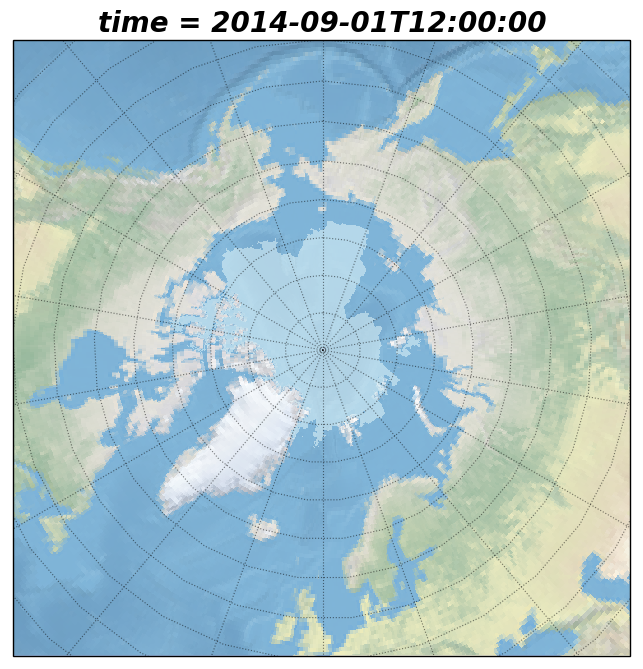

In [18]:
def plot_extent(date, ax): 
    ds     = xr.open_dataset('/scratch/AnnekeV/reanalysis_data/GLOBAL_REANALYSIS_PHY_001_030-TDS_{}{:02d}{:02d}_uv_uvice_con_thick.nc'.format(date.year, date.month, date.day))
    siconc = ds.siconc
    siconc.where(siconc > 0.15).isel(time=0).plot.imshow(ax = ax, transform = ccrs.PlateCarree(), cmap = cmocean.cm.ice_r, levels = [0.15,1.1] , alpha = 0.5, add_colorbar = False)

    
date = find_start_date("2014-09-01")
ax   = set_axes()
plot_extent(date, ax)


# with the sic run and reanalysis

## all particles

In [22]:
ds = xr.open_dataset("/scratch/AnnekeV/output/kernel_test_run_02_28_npart_11386_start_2014-02-01_simdays_1000_AdvectionRK4_ice_sic.nc", decode_times=False)

lat_init  = ds.lat.isel(obs = 0).values
lon_init  = ds.lon.isel(obs = 0).values
lat_final = ds.lat.isel(obs = 13).values   # after two months
lon_final = ds.lon.isel(obs = 13).values   # after two months

res  = 1
M, latbins, lonbins = trans_mat(res, lon_init, lon_final, lat_init, lat_final)


In [23]:
times    = 10
nlat     = len(latbins)-1
nlon     = len(lonbins)-1

R        = np.zeros((times, nlat*nlon+1))
R[0,:]   = 1.
M_sparse = csr_matrix(M)

for t in range(1,times):
     R[t,:] = M_sparse.dot(R[t-1,:])

print("Made position vectors")

Made position vectors


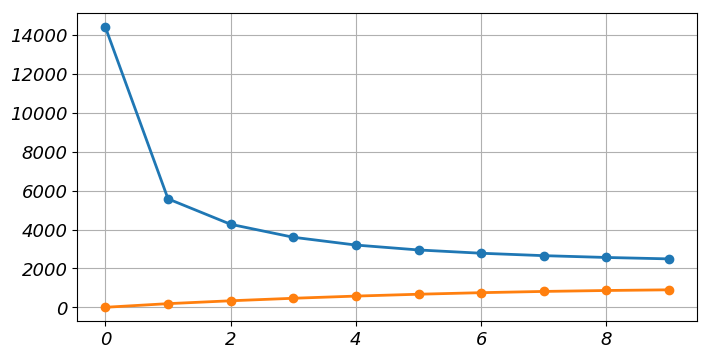

In [24]:
plt.plot(R.sum(axis=1)[:], marker = 'o')
plt.plot(R[:,-1], marker = 'o')

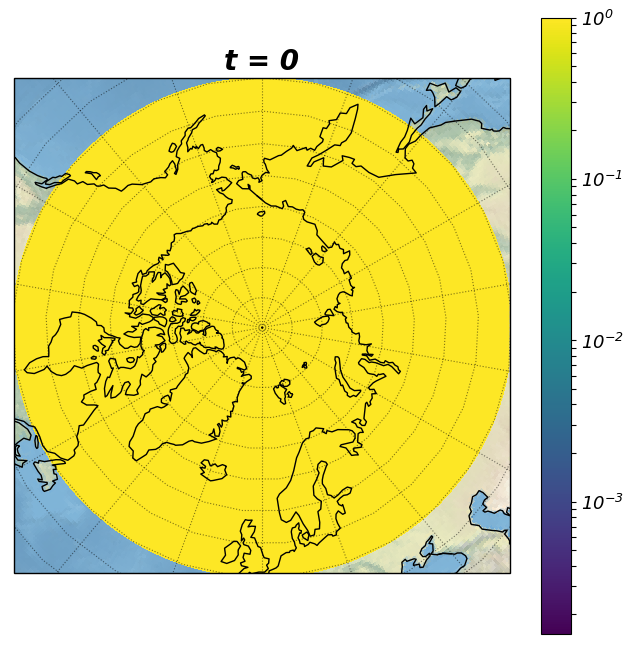

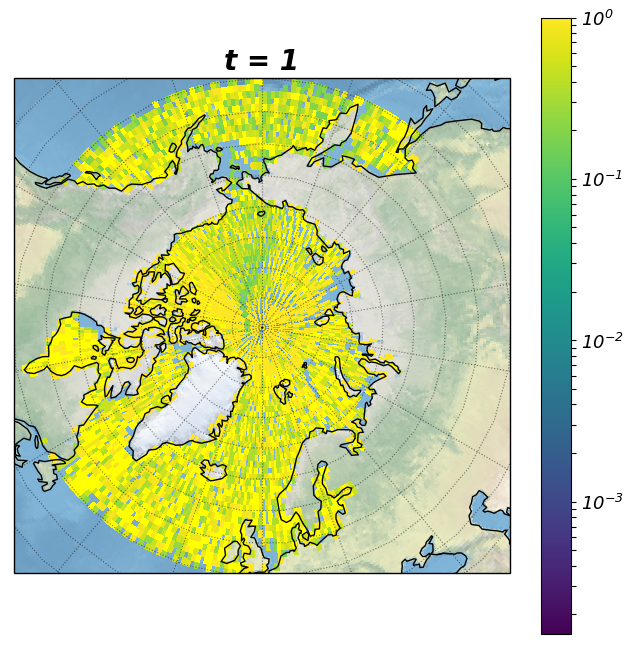

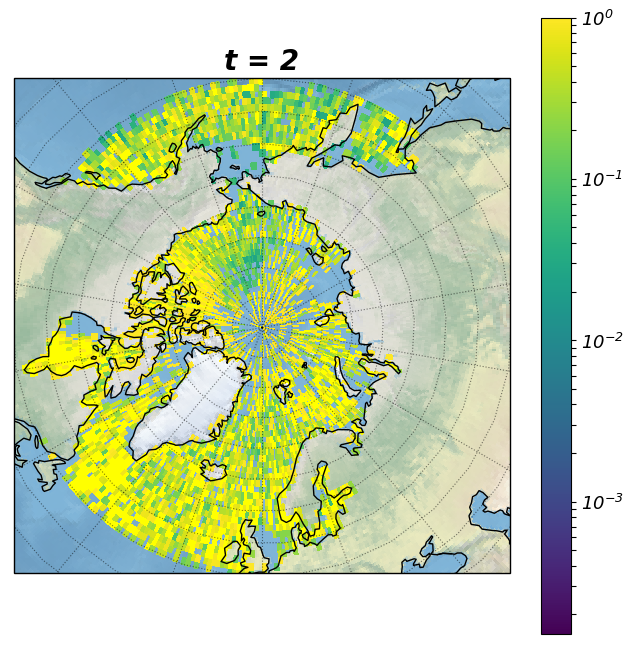

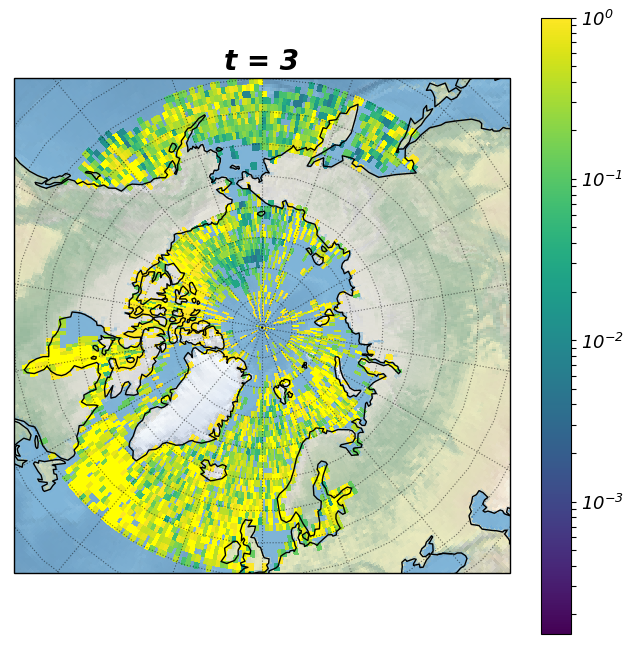

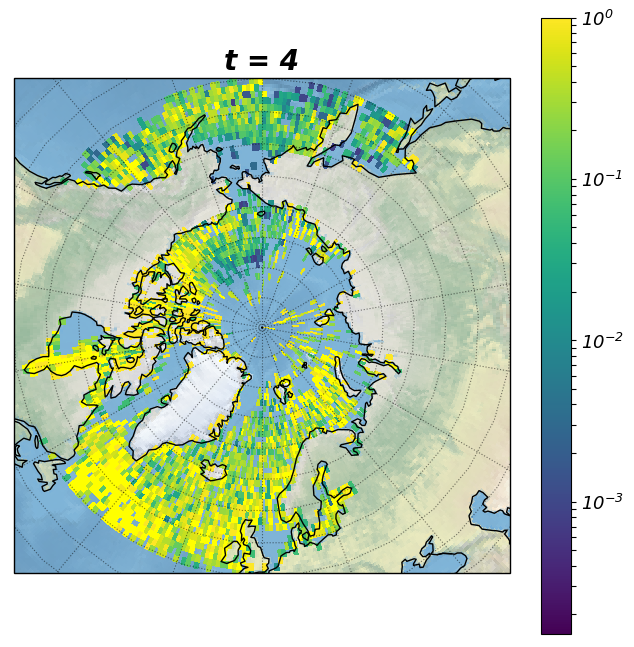

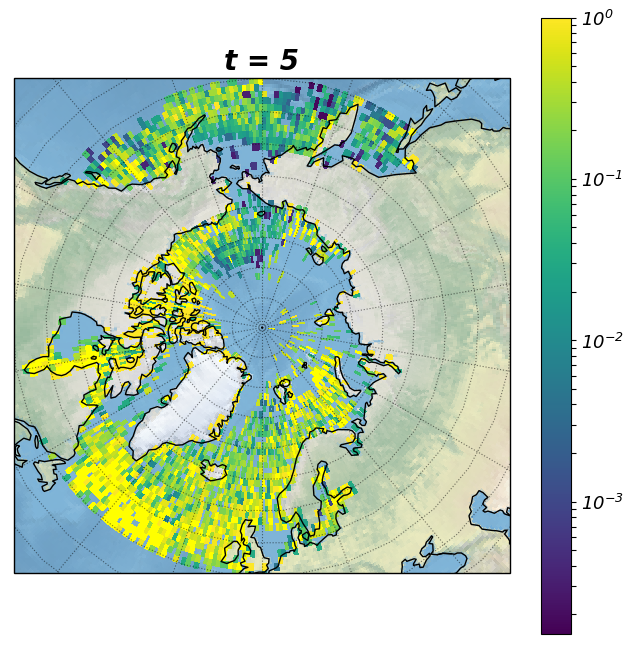

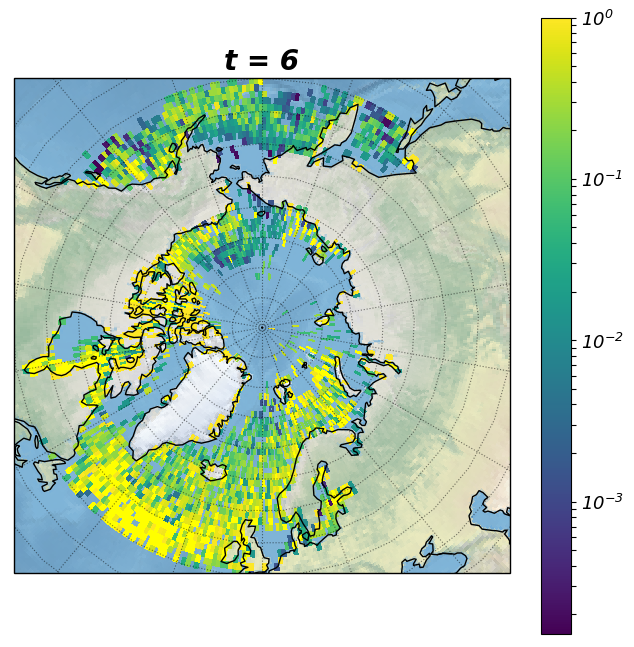

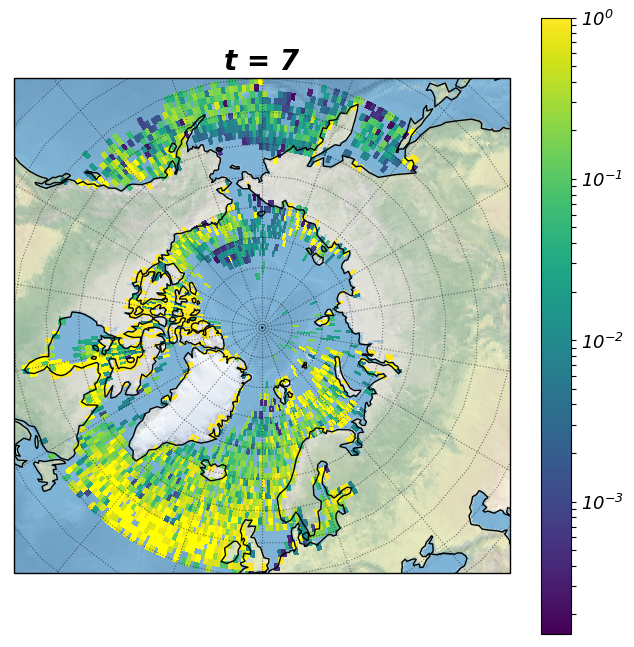

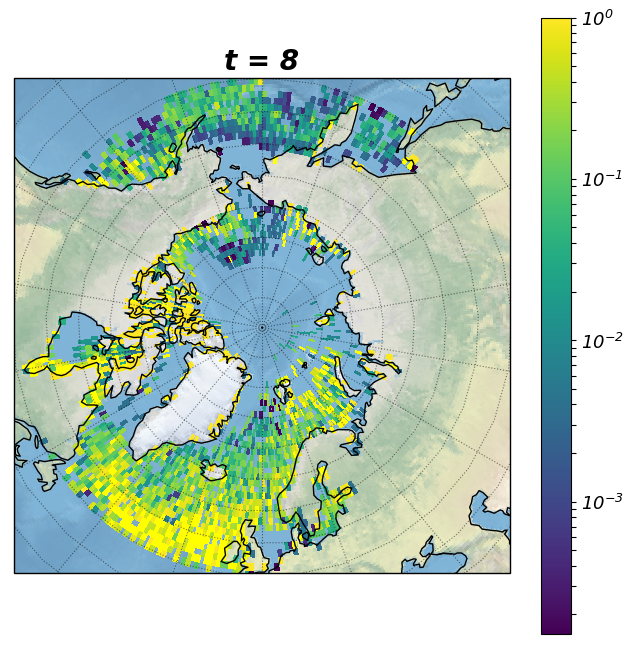

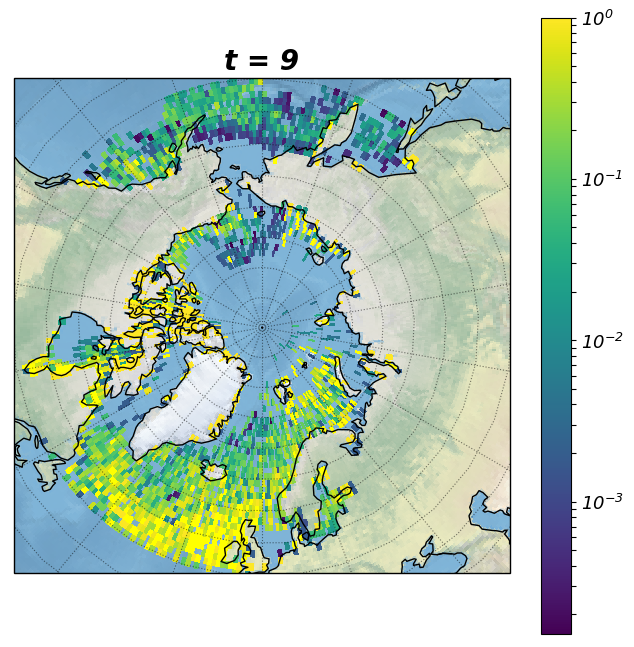

In [113]:
line = sorted(R[R!=0])
vmax = 1
vmin = line[int(len(line)*0.01)]  # 5 percentile 


times = np.size(R, 0)

for t in range(times):
    ax   = set_axes()
    p    = ax.pcolormesh(lonbins, latbins, R[t,:-1].reshape(nlat,nlon), transform = ccrs.PlateCarree() , norm = mpl.colors.LogNorm(vmin = vmin, vmax = vmax), cmap = 'viridis')
    plt.colorbar(p)
    ax.set_title("t = {}".format(t) )
    plt.savefig(fig_dir + "/transitionplots/20190403_days_{}_res_{}_march_t{}.png".format(5,res, t))
    plt.show()


# where values go from a value to a nan value

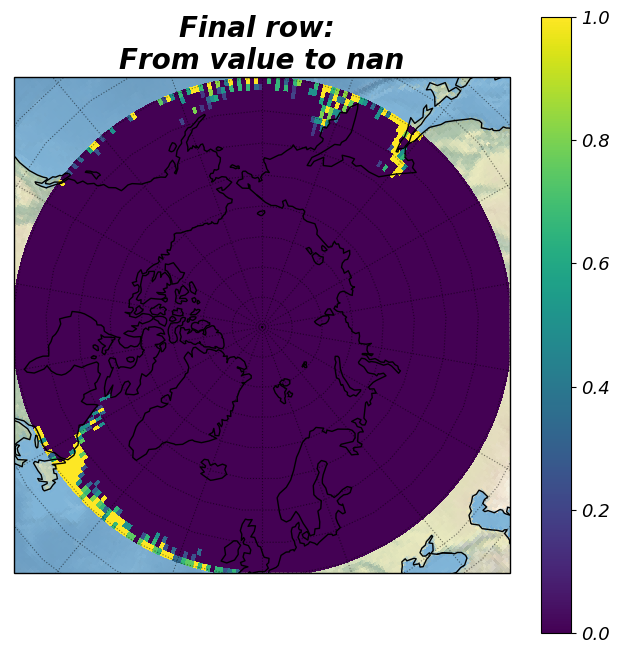

In [105]:
ax   = set_axes()
p    = ax.pcolormesh(lonbins, latbins, M[-1,:-1].reshape(nlat,nlon), transform = ccrs.PlateCarree())#,  norm = mpl.colors.LogNorm(vmin = vmin, vmax = 1))
plt.title("Final row: \nFrom value to nan")
plt.colorbar(p)
plt.savefig(fig_dir + "/transitionplots/20190403_disappearing_map.png")


In [56]:
atlantic = [np.argmin(abs(lonbins+100)), np.argmin(abs(lonbins-80))] #atlantic goes from from -100 to 80 E
atlantic

val_to_nan  =  M[-1,:-1].reshape(nlat,nlon)
sum_per_lon =  np.sum(val_to_nan/nlat/nlon*100, axis = 0)

plt.plot((lonbins[1:]+lonbins[:-1])/2.,sum_per_lon)
plt.xlabel("Longitude (degrees east)")
plt.ylabel("Percentage out of domain")

atlantic_total = np.sum(sum_per_lon[atlantic[0]:atlantic[1]])
pacific_total  = np.sum(sum_per_lon)-atlantic_total

print("Atlantic total = ", atlantic_total)
print("Pacific total  = ", pacific_total)

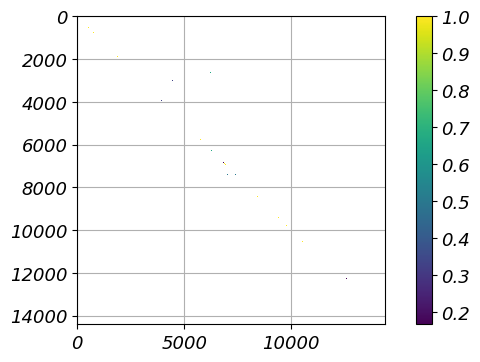

In [22]:
# Masked example of trans matrix
masked = np.ma.masked_where(M==0,M)
p = plt.imshow(masked)
plt.colorbar(p)

# Sinks

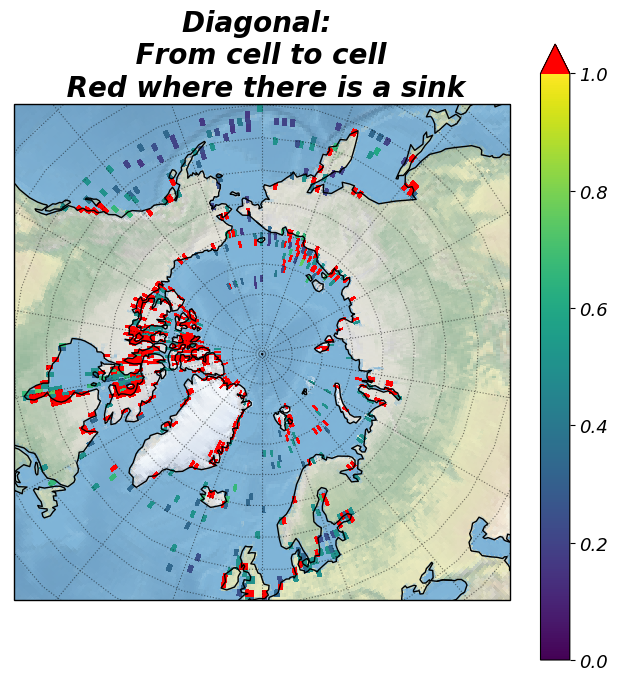

In [106]:
almost_zero = 1e-16
ax   = set_axes()
Mdia = np.diag(M)[:-1]
p    = ax.pcolormesh(lonbins, latbins, Mdia.reshape(nlat,nlon), transform = ccrs.PlateCarree())#,  norm = mpl.colors.LogNorm(vmin = vmin, vmax = 1))
p.cmap.set_under('k', alpha =0)
p.cmap.set_over('red')
p.set_clim(almost_zero, 1. -almost_zero)
plt.title("Diagonal: \n From cell to cell \n Red where there is a sink")
plt.colorbar(p, extend = 'max')
plt.savefig(fig_dir + "/transitionplots/20190403_sinks.png")


In [92]:
sinks = np.where(Mdia[:-1]==1)[0]
Mnosinks = M.copy()
Mnosinks[sinks, sinks] = 0

Mnosinks_sum = np.sum(Mnosinks, axis=0)
Mnosinks_sum[Mnosinks_sum==0] =1
Mnosinks/=Mnosinks_sum


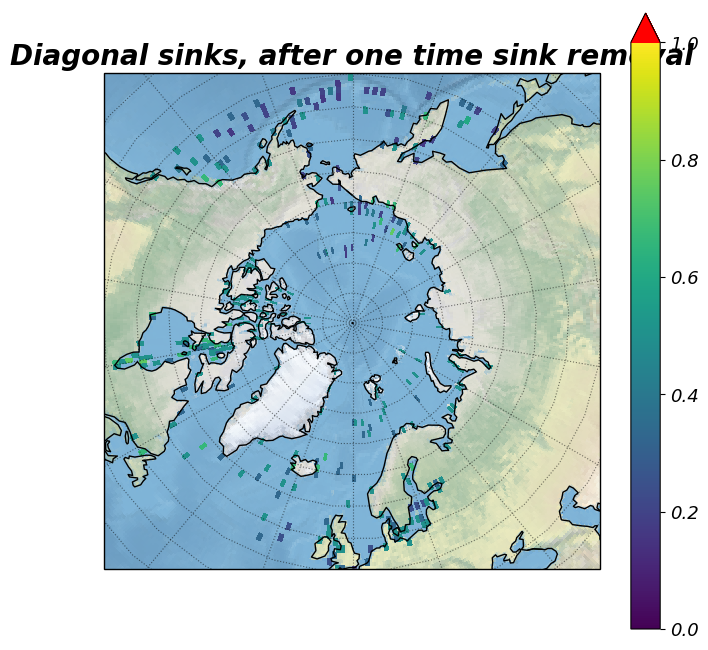

In [107]:
almost_zero = 1e-16
ax   = set_axes()
Mnosinks_dia = np.diag(Mnosinks)[:-1]
p    = ax.pcolormesh(lonbins, latbins, Mnosinks_dia.reshape(nlat,nlon), transform = ccrs.PlateCarree())#,  norm = mpl.colors.LogNorm(vmin = vmin, vmax = 1))
p.cmap.set_under('k', alpha =0)
p.cmap.set_over('red')
p.set_clim(almost_zero, 1. -almost_zero)
plt.title("Diagonal sinks, after one time sink removal")
plt.colorbar(p, extend = 'max')
plt.savefig(fig_dir + "/transitionplots/20190403_sinks_removed.png")


# No sinks multiplication

In [99]:
times    = 4


Rnosinks = np.zeros((times, nlat*nlon+1))
Rnosinks[0,:]   = 1.
Mnosinks_sparse = csr_matrix(Mnosinks)

for t in range(1,times):
     Rnosinks[t,:] = Mnosinks_sparse.dot(Rnosinks[t-1,:])

print("Made position vectors")


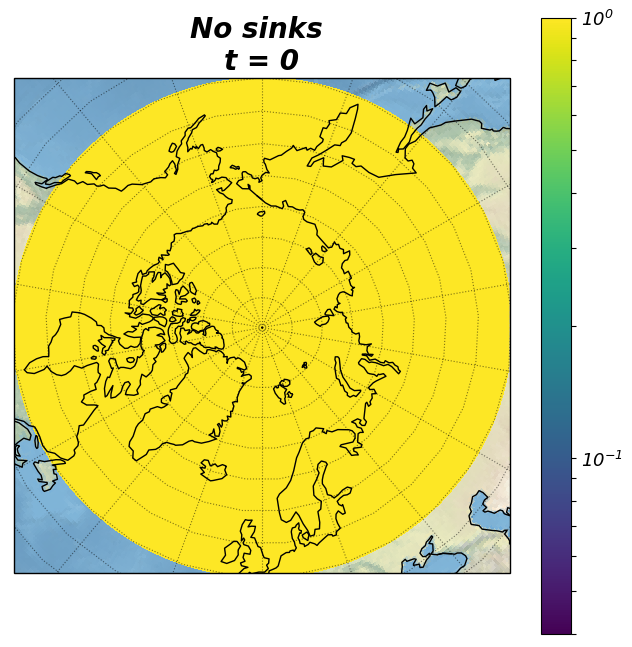

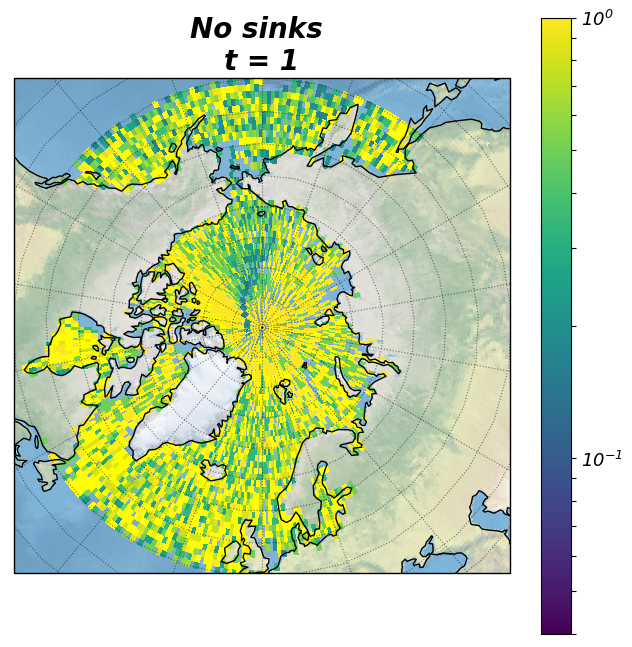

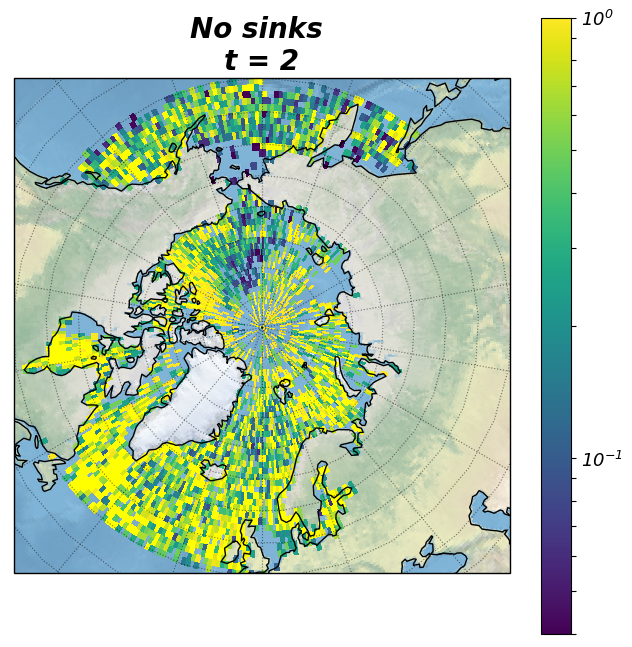

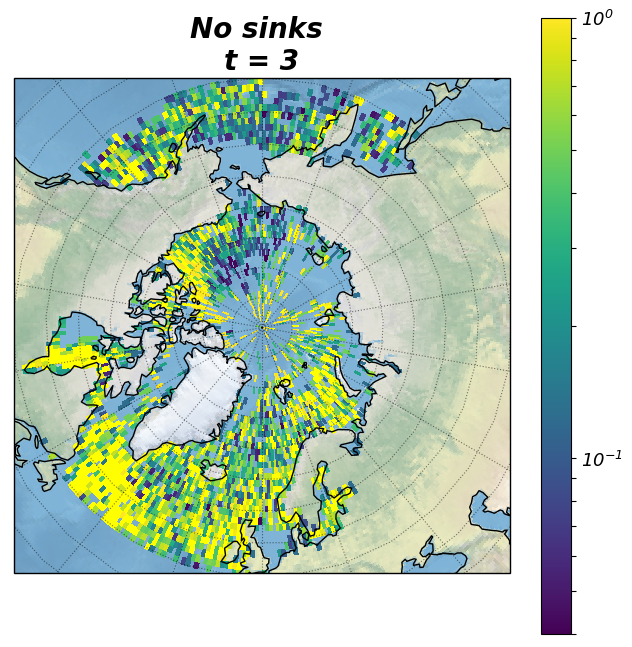

In [111]:

line = sorted(Rnosinks[Rnosinks!=0])
vmax = 1
vmin = line[int(len(line)*0.01)]  # 5 percentile 

for t in range(times):
    ax   = set_axes()
    p    = ax.pcolormesh(lonbins, latbins, (Rnosinks[t,:-1]).reshape(nlat,nlon), transform = ccrs.PlateCarree() , norm = mpl.colors.LogNorm(vmin = vmin, vmax = vmax), cmap = 'viridis')
    p.cmap.set_over("yellow")
    plt.colorbar(p)
    ax.set_title("No sinks \nt = {}".format(t) )
    plt.savefig(fig_dir + "/transitionplots/20190403_days_{}_res_{}_march_t{}_nosinks.png".format(5,res, t))
    plt.show()

In [69]:
notnanM = np.count_nonzero(~np.isnan(M))
Melements = np.size(M,0)*np.size(M,1)
print(notnanM, Melements)

'''NO NANS HERE '''

(207388801, 207388801)


In [100]:
np.max(Rnosinks)

464.59371759259267

## Load files trial

In [8]:
'''Load values'''
everywhere_try1 = "/scratch/AnnekeV/output/everywhere/run_02_19_npart_17059_start_2014-02-01_simdays_35_AdvectionRK4_ice"
# everywhere_try2 = "/scratch/AnnekeV/output/everywhere/run_02_19_npart_867407_start_2014-02-01_simdays_35_AdvectionRK4_ice"

ds = xr.open_dataset(everywhere_try1 + ".nc", decode_times=False)

lat_init  = ds.lat.isel(obs=0).values
lon_init  = ds.lon.isel(obs=0).values

lat_final = ds.lat.isel(obs=-1).values
lon_final = ds.lon.isel(obs=-1).values
res = 2

In [9]:
'''Set parameters'''

nlat = 8
nlon = 12
ncel = nlat*nlon
nparticles = len(lat_init)

latbins = np.linspace(50,90, nlat+1)
lonbins = np.linspace(-180,180,nlon+1)
M = np.zeros((ncel,ncel))


def binned_statistic(x, nbins, range):
    '''The usage is nearly the same as scipy.stats.binned_statistic''' 
    r0, r1 = range
    digitized = (float(nbins)/(r1 - r0)*(x - r0)).astype(int)    
    return digitized




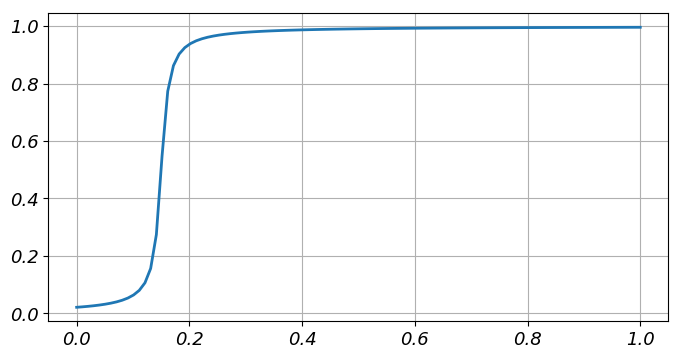

In [166]:
x = np.linspace(0,1,100)
y = np.arctan((x*100)-15)/np.pi +.5


plt.plot(x,y)

In [117]:
import random

In [118]:
random.seed()

In [147]:
sic = .3

In [167]:
ice = 0
for i in range(10000):
    if random.random() < np.arctan((sic*100)-15)/np.pi +.5  and sic >.01:
        ice += 1
print ice

9788


/home/students/6252699/miniconda2/envs/parcels2/lib/python2.7/site-packages/xarray/core/nanops.py:161: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


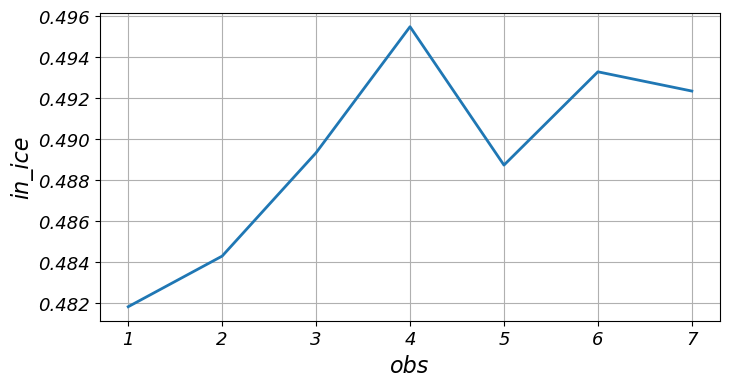

In [8]:
ds = xr.open_dataset('/home/students/6252699/thesis/parcels2/output/test2_ice_or_ocean_kernel_npart_11386_start_2014-02-01_simdays_35_AdvectionRK4_prob.nc', decode_times = False)
ds.in_ice.mean(dim="traj").plot()

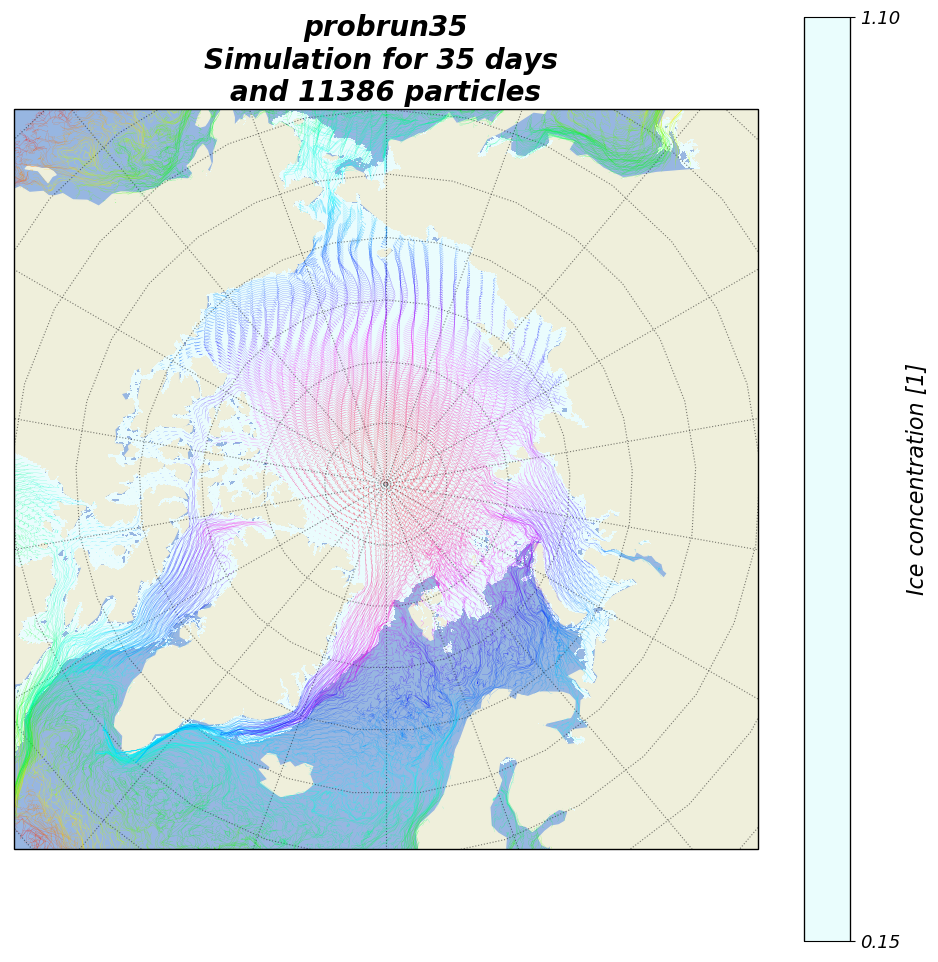

In [19]:
prob = '/home/students/6252699/thesis/parcels2/output/test2_ice_or_ocean_kernel_npart_11386_start_2014-02-01_simdays_35_AdvectionRK4_prob.nc'
plot_functions.plot_trajectory_map(prob, savefig=True, extra_title="probrun35")